In [1]:
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib as mpl
import numpy as np
import scipy as sp
from skimage import transform as skt
import os
import time
import multiprocessing as mp
import skimage.filters as skf
from scipy import ndimage as scnd
import hdf5storage as h5
from matplotlib_scalebar.scalebar import ScaleBar,SI_LENGTH_RECIPROCAL
import math
import numba
import sys
from ncempy import io as emio
import pyfftw.interfaces as pfi
import pymcr
%matplotlib inline
plt.rcParams['image.cmap'] = 'magma'
plt.rcParams.update({'font.size': 25})
plt.rcParams.update({'font.weight': 'bold'})

In [2]:
import sys
sys.path.append('/Users/7dm/stemtools')
import stemtools as st
%load_ext autoreload
%autoreload 2

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
image_dm3 = emio.dm.dmReader('/Users/7dm/Desktop/Yu Chuan Images/5eV_selenized WS2_190125_100kV_2-8nm-3D Stack.dm3')
adf_image_stack = image_dm3['data']

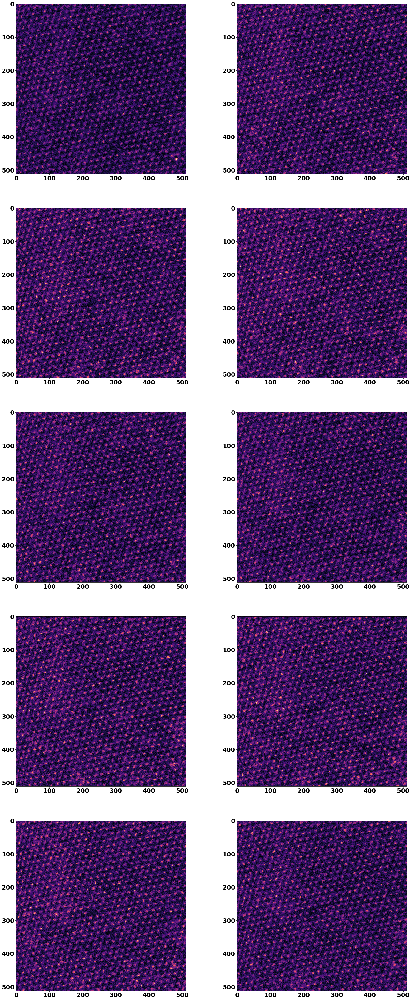

In [5]:
plt.figure(figsize=(30,75))
for ii in range(adf_image_stack.shape[0]):
    plt.subplot(5,2,ii+1)
    plt.imshow(adf_image_stack[ii,:,:])

In [6]:
st.tic()
im1 = adf_image_stack[9,:,:]
im2 = adf_image_stack[5,:,:]
rs,cs,_,_,registered_fft = st.util.dftregistration(np.fft.fft2(im1),np.fft.fft2(im2),1000)
st.toc()

Elapsed time: 0.405148 seconds.



In [7]:
rs,cs

(-5.75, 0.749)

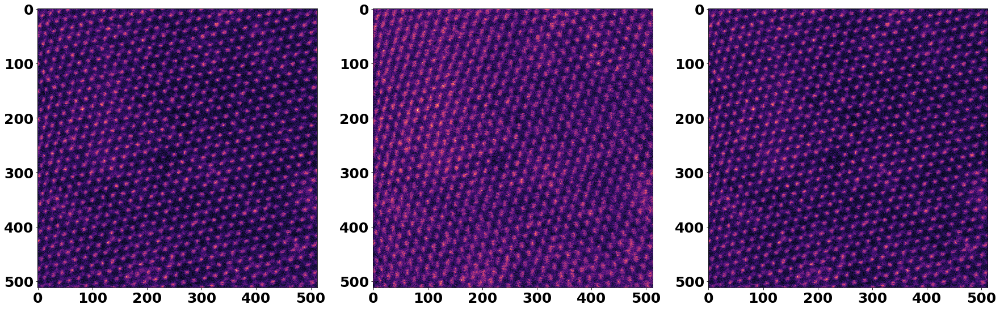

In [8]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(im1+np.abs(np.fft.ifft2(registered_fft)))
plt.subplot(1,3,2)
plt.imshow(im1+im2)
plt.subplot(1,3,3)
plt.imshow(im1+np.abs(st.util.move_by_phase(im2,cs,rs)))

In [9]:
%timeit st.util.get_shift_stack(adf_image_stack[0:2,:,:])

511 ms ± 19.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [10]:
st.tic()
rowshifts,colshifts = st.util.get_shift_stack(adf_image_stack)
st.toc()

Elapsed time: 13.127518 seconds.



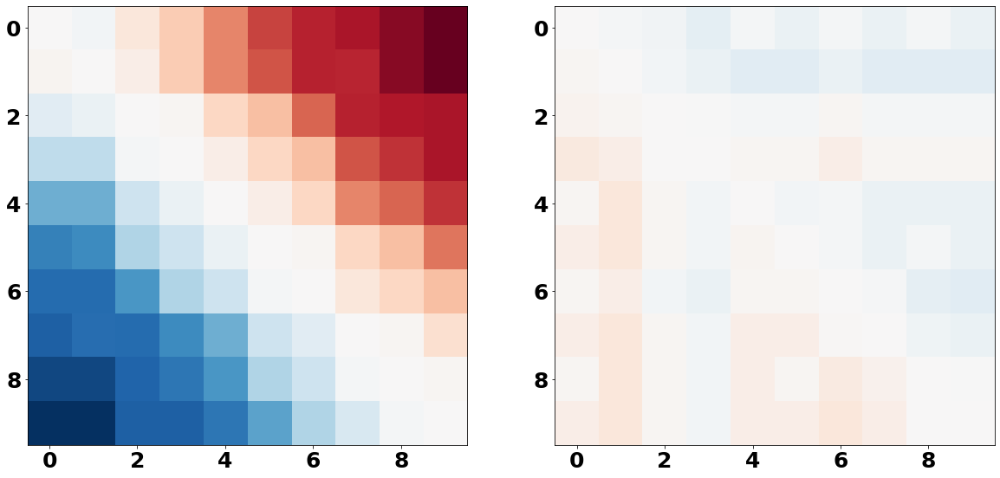

In [11]:
vm = np.amax(np.abs(np.concatenate((rowshifts,colshifts))))
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(rowshifts,vmin=-vm,vmax=vm,cmap='RdBu_r')
plt.subplot(1,2,2)
plt.imshow(colshifts,vmin=-vm,vmax=vm,cmap='RdBu_r')

In [12]:
%timeit st.util.corrected_stack(adf_image_stack[0:2,:,:],rowshifts[0:2,0:2],colshifts[0:2,0:2])

23.1 ms ± 724 µs per loop (mean ± std. dev. of 7 runs, 1 loop each)


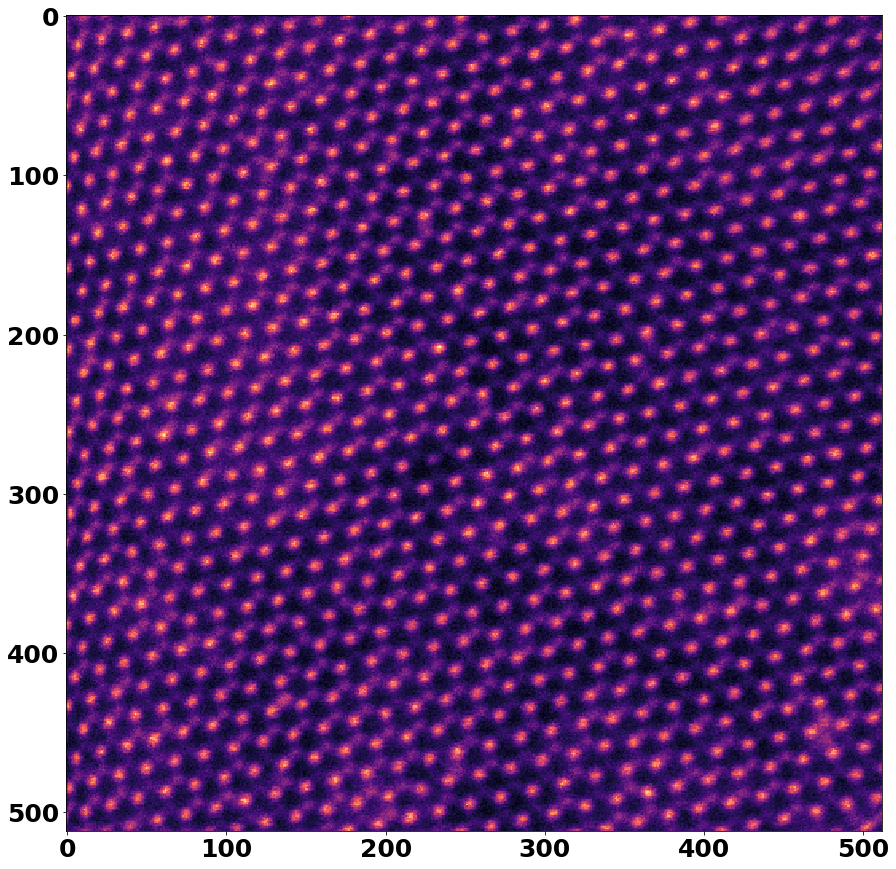

In [13]:
plt.figure(figsize=(15,15))
plt.imshow(st.util.corrected_stack(adf_image_stack,rowshifts,colshifts))